In [1]:
from google.colab import drive

drive.mount('/content/drive', force_remount=True)
# !ls "/content/drive/MyDrive/FE_projects/"
# !ls "/content/drive/Shared Drives/FE_projects/"

Mounted at /content/drive


In [1]:
import pandas as pd
import numpy as np
# df = pd.read_csv('/content/drive/MyDrive/FE_projects/2025-03.csv')
# df = pd.read_csv('/content/drive/MyDrive/FE_projects/2003-12.csv')
# df = pd.read_csv('/content/drive/MyDrive/FE_projects/FRED-MD_2015m5.csv')
df = pd.read_csv("FRED-MD_2015m5.csv")
df

,sasdate,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLx,RETAILx,INDPRO,IPFPNSS,IPFINAL,IPCONGD,...,DNDGRG3M086SBEA,DSERRG3M086SBEA,CES0600000008,CES2000000008,CES3000000008,UMCSENTx,MZMSL,DTCOLNVHFNM,DTCTHFNM,INVEST
0,Transform:,5.0,5.0,5.000,5.000000e+00,5.00000,5.0000,5.0000,5.0000,5.0000,...,6.000,6.000,6.00,6.00,6.00,2.0,6.0,6.00,6.00,6.0000
1,1/1/1959,2289.8,2151.8,18.191,2.533386e+05,18234.44037,21.9289,21.5499,20.9407,28.4830,...,19.874,12.133,2.13,2.45,2.04,NaN,274.9,6476.00,12298.00,84.2043
2,2/1/1959,2299.6,2160.4,18.380,2.552800e+05,18368.21974,22.3584,21.8408,21.1221,28.6919,...,19.882,12.149,2.13,2.46,2.05,NaN,276.0,6476.00,12298.00,83.5280
3,3/1/1959,2314.4,2176.2,18.555,2.545013e+05,18521.70306,22.6805,21.9730,21.2257,28.6919,...,19.868,12.169,2.15,2.45,2.07,NaN,277.4,6508.00,12349.00,81.6405
4,4/1/1959,2328.5,2190.7,18.488,2.594625e+05,18533.11060,23.1636,22.2903,21.5367,29.1445,...,19.880,12.211,2.16,2.47,2.08,NaN,278.1,6620.00,12484.00,81.8099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
672,12/1/2014,13799.8,11434.6,113.177,1.204571e+06,437590.00000,106.2205,99.5131,101.8782,98.7093,...,110.685,111.266,21.66,24.78,19.62,NaN,12924.0,326890.04,882566.01,2924.2632
673,1/1/2015,13909.8,11509.9,113.367,1.207152e+06,434225.00000,105.8642,99.3393,101.5834,98.9953,...,108.115,111.369,21.71,24.94,19.64,NaN,12989.7,326956.11,880431.44,2952.2428
674,2/1/2015,13946.9,11536.9,113.364,1.208728e+06,431921.00000,105.7955,99.5237,101.8177,99.4408,...,108.533,111.507,21.71,24.78,19.70,NaN,13107.7,326701.50,878190.18,2973.3743
675,3/1/2015,13928.7,11505.5,113.671,NaN,436776.00000,105.4549,99.0929,101.5335,99.3613,...,109.020,111.668,21.82,25.08,19.76,NaN,13163.1,328710.29,880378.35,2976.8755


ALSO: Instead of manually testing the series, we can follow the authors' FREDMD's recommendation of how to best make the time series stationary:
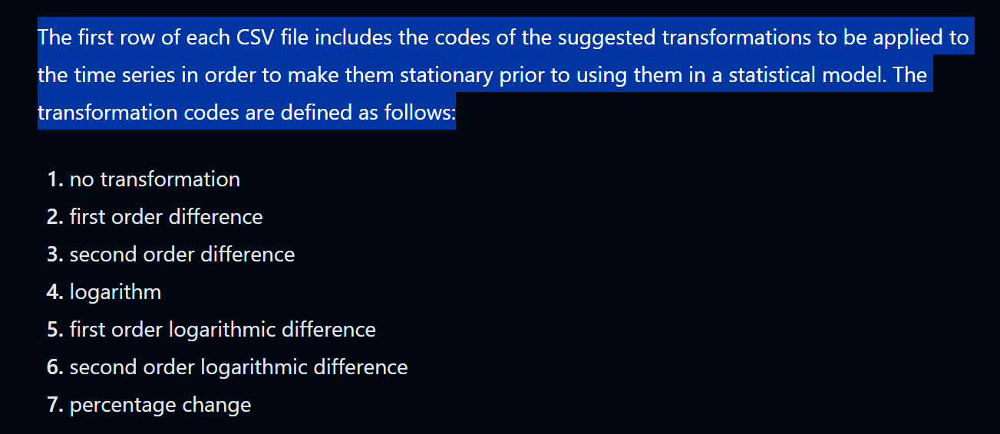

# Paper Recreation - Balanced Panel

See: https://fg-research.com/blog/general/posts/fred-md-overview.html

In [3]:
# if in row index 0, 1, nothing, 2 do first order difference, 3 second order difference, 4 logarithm, 5 first order logarithmic difference, 6 second order logarithmic difference, 7 percentage change
import os
import pandas as pd
import numpy as np

def transform_series(x, tcode):
    '''
    Transform the time series.

    Parameters:
    ______________________________
    x: pandas.Series
        Time series.

    tcode: int.
        Transformation code.
    '''

    if tcode == 1:
        return x
    elif tcode == 2:
        return x.diff()
    elif tcode == 3:
        return x.diff().diff()
    elif tcode == 4:
        return np.log(x)
    elif tcode == 5:
        return np.log(x).diff()
    elif tcode == 6:
        return np.log(x).diff().diff()
    elif tcode == 7:
        return x.pct_change()
    else:
        raise ValueError(f"unknown `tcode` {tcode}")

def get_data(transform=True):
    '''
    Download and (optionally) transform the time series.

    Parameters:
    ______________________________
    year: int
        The year of the dataset vintage.

    month: int.
        The month of the dataset vintage.

    transform: bool.
        Whether the time series should be transformed or not.
    '''

    # get the time series
    data = pd.read_csv("FRED-MD_2015m5.csv", skiprows=[1], index_col=0)
    data.columns = [c.upper() for c in data.columns]

    # process the dates
    data = data.loc[pd.notna(data.index), :]
    data.index = pd.date_range(start="1959-01-01", freq="MS", periods=len(data))

    if transform:

        # get the transformation codes
        tcodes = pd.read_csv("FRED-MD_2015m5.csv", nrows=1, index_col=0)
        tcodes.columns = [c.upper() for c in tcodes.columns]

        # transform the time series
        data = data.apply(lambda x: transform_series(x, tcodes[x.name].item()))

    return data

# Remove the first row (which held the tcodes)
df = get_data(transform=True)
df

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLX,RETAILX,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DNDGRG3M086SBEA,DSERRG3M086SBEA,CES0600000008,CES2000000008,CES3000000008,UMCSENTX,MZMSL,DTCOLNVHFNM,DTCTHFNM,INVEST
1959-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1959-02-01,0.004271,0.003989,0.010336,0.007634,0.007310,0.019397,0.013409,0.008625,0.007307,0.005238,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1959-03-01,0.006415,0.007287,0.009476,-0.003055,0.008321,0.014303,0.006035,0.004893,0.000000,0.019389,...,-0.001107,0.000327,0.009346,-0.008147,0.004819,NaN,0.001066,0.004929,0.004138,-0.014792
1959-04-01,0.006074,0.006641,-0.003617,0.019306,0.000616,0.021077,0.014337,0.014546,0.015651,0.006382,...,0.001308,0.001801,-0.004705,0.012203,-0.004890,NaN,-0.002539,0.012134,0.006734,0.024929
1959-05-01,0.005994,0.006824,0.011936,0.007018,0.007803,0.014950,0.008270,0.009584,0.004768,0.020156,...,-0.001711,-0.001891,-0.000021,-0.004090,-0.004819,NaN,0.004646,0.002828,0.002020,-0.015342
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-12-01,0.005603,0.005059,0.000681,0.005742,-0.008769,-0.000512,-0.005710,-0.007078,-0.005316,-0.004775,...,-0.001709,-0.000803,-0.002306,-0.002822,-0.000510,NaN,0.002062,0.005821,0.008617,0.011412
2015-01-01,0.007940,0.006564,0.001677,0.002140,-0.007720,-0.003360,-0.001748,-0.002898,0.002893,-0.009371,...,-0.011754,-0.000253,0.004611,0.008452,0.002038,NaN,-0.001699,-0.004456,-0.013636,-0.006287
2015-02-01,0.002664,0.002343,-0.000026,0.001305,-0.005320,-0.000649,0.001855,0.002304,0.004490,-0.019711,...,0.027352,0.000313,-0.002306,-0.012872,0.002031,NaN,0.003972,-0.000981,-0.000127,-0.002390
2015-03-01,-0.001306,-0.002725,0.002704,NaN,0.011178,-0.003225,-0.004338,-0.002795,-0.000800,0.022243,...,0.000618,0.000204,0.005054,0.018470,-0.000009,NaN,-0.004825,0.006909,0.005037,-0.005955


we actually need to drop the last row, the authors have 675 observations not 676.

Following previous studies, we take 1960:1 as the start of the sample. After losing two observations to data transformation, the panel we use for analysis is for the sample 1960:3 to 2014:12 with 658 observations

In [83]:
# male 1960:3 the start to 2014:12
df=df.iloc[14:-4,:]
df

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLX,RETAILX,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DNDGRG3M086SBEA,DSERRG3M086SBEA,CES0600000008,CES2000000008,CES3000000008,UMCSENTX,MZMSL,DTCOLNVHFNM,DTCTHFNM,INVEST
1960-03-01,0.001837,0.000843,0.014064,-0.027752,-0.001102,-0.009018,-0.003426,-0.001148,0.001151,-0.019968,...,0.001748,-0.001040,-0.000020,3.013134e-02,-0.004684,NaN,0.001738,0.003472,0.000951,0.003490
1960-04-01,0.003498,0.003585,0.015352,0.009277,0.025903,-0.007960,0.002286,0.001148,0.006880,-0.001185,...,0.004470,0.001514,-0.004474,-6.807429e-02,0.000000,NaN,-0.001048,0.008678,0.005452,0.024136
1960-05-01,0.002533,0.002559,-0.020349,-0.031425,-0.015047,-0.001140,0.005691,0.006865,0.005698,0.009456,...,-0.006715,0.000711,0.000000,4.161967e-02,0.000000,NaN,0.001035,-0.004827,-0.002067,0.003798
1960-06-01,0.000456,-0.000441,-0.000261,0.008442,-0.001364,-0.012653,-0.011415,-0.011470,-0.006841,-0.010642,...,0.000248,-0.000879,0.000000,-1.142870e-02,0.000000,NaN,0.001027,0.005126,0.007420,-0.009981
1960-07-01,0.001036,0.001101,0.002033,-0.007056,-0.010099,-0.003477,-0.005757,-0.005780,-0.009197,-0.038796,...,0.001785,0.000629,0.000000,7.547206e-03,0.000000,NaN,0.001358,-0.010926,-0.003291,0.032176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-08-01,0.004433,0.004007,0.006546,-0.002216,0.005777,-0.000150,-0.004149,-0.006905,-0.009831,-0.036831,...,-0.006594,0.000279,-0.000467,-1.643091e-07,-0.000004,0.7,-0.003632,0.000220,0.000318,-0.008320
2014-09-01,0.001236,0.001315,0.001581,0.002808,-0.003194,0.007008,0.006520,0.006184,0.009475,-0.002963,...,0.005408,-0.000129,-0.001387,2.830980e-03,-0.002549,2.1,0.000668,0.000937,-0.001237,0.006109
2014-10-01,0.003038,0.003429,0.003830,0.003807,0.004285,-0.000402,0.001347,0.000289,-0.003087,-0.001416,...,-0.001714,0.000124,0.001383,-1.218899e-03,0.002037,2.3,0.001568,-0.007595,-0.003711,-0.004309
2014-11-01,0.005568,0.006340,0.005355,0.004154,0.005121,0.010701,0.015374,0.018260,0.021534,0.035432,...,-0.008026,0.000448,-0.001844,-1.211548e-03,-0.002037,NaN,-0.000597,-0.001849,0.002456,0.001929


In [100]:
# We Double check the amount of missing observations at the beginning and the end of the sample
sum(df.isna().sum())

0

In [90]:
# if df.isna().sum() > 0 has a true entry, drop the respective column
df = df.dropna(axis=1)
print(sum(df.isna().sum())) # We have our balanced panel with missing values
df.head()

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLX,RETAILX,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DDURRG3M086SBEA,DNDGRG3M086SBEA,DSERRG3M086SBEA,CES0600000008,CES2000000008,CES3000000008,MZMSL,DTCOLNVHFNM,DTCTHFNM,INVEST
1960-03-01,0.001837,0.000843,0.014064,-0.027752,-0.001102,-0.009018,-0.003426,-0.001148,0.001151,-0.019968,...,-0.004558,0.001748,-0.001040,-0.000020,0.030131,-0.004684,0.001738,0.003472,0.000951,0.003490
1960-04-01,0.003498,0.003585,0.015352,0.009277,0.025903,-0.007960,0.002286,0.001148,0.006880,-0.001185,...,0.004139,0.004470,0.001514,-0.004474,-0.068074,0.000000,-0.001048,0.008678,0.005452,0.024136
1960-05-01,0.002533,0.002559,-0.020349,-0.031425,-0.015047,-0.001140,0.005691,0.006865,0.005698,0.009456,...,-0.001319,-0.006715,0.000711,0.000000,0.041620,0.000000,0.001035,-0.004827,-0.002067,0.003798
1960-06-01,0.000456,-0.000441,-0.000261,0.008442,-0.001364,-0.012653,-0.011415,-0.011470,-0.006841,-0.010642,...,-0.002623,0.000248,-0.000879,0.000000,-0.011429,0.000000,0.001027,0.005126,0.007420,-0.009981
1960-07-01,0.001036,0.001101,0.002033,-0.007056,-0.010099,-0.003477,-0.005757,-0.005780,-0.009197,-0.038796,...,0.002824,0.001785,0.000629,0.000000,0.007547,0.000000,0.001358,-0.010926,-0.003291,0.032176


we get the exact same dataframe

## Non-Balanced Panel Data for Paper Results
We do not drop the other series and use our EM algorithm instead to fill missing observations

In [28]:
# Remove the first row (which held the tcodes)
df = get_data(transform=True)
# male 1960:3 the start to 2014:12
df=df.iloc[12:-1,:]
df

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLX,RETAILX,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DNDGRG3M086SBEA,DSERRG3M086SBEA,CES0600000008,CES2000000008,CES3000000008,UMCSENTX,MZMSL,DTCOLNVHFNM,DTCTHFNM,INVEST
1960-01-01,0.004317,0.005743,0.002754,0.017046,0.026606,0.025915,0.024099,0.029025,0.031236,0.103832,...,-0.001798,-0.001204,-0.004680,0.007797,-0.009705,NaN,-0.002451,0.004292,-0.011739,-0.013330
1960-02-01,0.000669,0.000488,0.004380,0.014596,0.003696,-0.008938,-0.005685,-0.003441,-0.011455,-0.013859,...,0.001649,0.000638,-0.004555,0.003853,-0.004750,NaN,-0.000001,0.008268,0.005388,-0.018942
1960-03-01,0.001837,0.000843,0.014064,-0.027752,-0.001102,-0.009018,-0.003426,-0.001148,0.001151,-0.019968,...,0.001748,-0.001040,-0.000020,0.030131,-0.004684,NaN,0.001738,0.003472,0.000951,0.003490
1960-04-01,0.003498,0.003585,0.015352,0.009277,0.025903,-0.007960,0.002286,0.001148,0.006880,-0.001185,...,0.004470,0.001514,-0.004474,-0.068074,0.000000,NaN,-0.001048,0.008678,0.005452,0.024136
1960-05-01,0.002533,0.002559,-0.020349,-0.031425,-0.015047,-0.001140,0.005691,0.006865,0.005698,0.009456,...,-0.006715,0.000711,0.000000,0.041620,0.000000,NaN,0.001035,-0.004827,-0.002067,0.003798
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-11-01,0.005568,0.006340,0.005355,0.004154,0.005121,0.010701,0.015374,0.018260,0.021534,0.035432,...,-0.008026,0.000448,-0.001844,-0.001212,-0.002037,NaN,-0.000597,-0.001849,0.002456,0.001929
2014-12-01,0.005603,0.005059,0.000681,0.005742,-0.008769,-0.000512,-0.005710,-0.007078,-0.005316,-0.004775,...,-0.001709,-0.000803,-0.002306,-0.002822,-0.000510,NaN,0.002062,0.005821,0.008617,0.011412
2015-01-01,0.007940,0.006564,0.001677,0.002140,-0.007720,-0.003360,-0.001748,-0.002898,0.002893,-0.009371,...,-0.011754,-0.000253,0.004611,0.008452,0.002038,NaN,-0.001699,-0.004456,-0.013636,-0.006287
2015-02-01,0.002664,0.002343,-0.000026,0.001305,-0.005320,-0.000649,0.001855,0.002304,0.004490,-0.019711,...,0.027352,0.000313,-0.002306,-0.012872,0.002031,NaN,0.003972,-0.000981,-0.000127,-0.002390


# Further Analysis

While we provide a csv file with current and historical data, FRED-MD is not a balanced panel
for a number of reasons:

(1) The S&P PE ratio (series 83) is taken from Shiller’s website and is released with roughly a
6-month lag. Hence observations are missing at the end of the sample.

(2) The Michigan Survey of Consumer Sentiment (series 130) is available only quarterly prior to
1977:11, and recent data are available in FRED with a 1-year lag.

(3) The trade-weighted exchange rate (series 101) is available in FRED only through 1973:1, and
we have not found other documented sources with which to splice the series.

(4) Seasonally adjusted housing permits (series 55-59) exist only through 1960:01.

(5) A few Value of Manufacturers’ Orders components such as Nondefense Capital Goods (series
66) and especially Consumer Goods (series 64) have a limited history because of the new
NAICS discussed above.

In [25]:
tickers = [
    # Group 1: Output and Income
    'RPI', 'W875RX1', 'INDPRO', 'IPFPNSS', 'IPFINAL', 'IPCONGD', 'IPDCONGD',
    'IPNCONGD', 'IPBUSEQ', 'IPMAT', 'IPDMAT', 'IPNMAT', 'IPMANSICS', 'IPB51222s',
    'IPFUELS', 'NAPMPI', 'CUMFNS',

    # Group 2: Labor Market
    'HWI', 'HWIURATIO', 'CLF16OV', 'CE16OV', 'UNRATE', 'UEMPMEAN', 'UEMPLT5',
    'UEMP5TO14', 'UEMP15OV', 'UEMP15T26', 'UEMP27OV', 'CLAIMSx', 'PAYEMS',
    'USGOOD', 'CES1021000001', 'USCONS', 'MANEMP', 'DMANEMP', 'NDMANEMP',
    'SRVPRD', 'USTPU', 'USWTRADE', 'USTRADE', 'USFIRE', 'USGOVT', 'CES0600000007',
    'AWOTMAN', 'AWHMAN', 'NAPMEI', 'CES0600000008', 'CES2000000008',
    'CES3000000008',

    # Group 3: Consumption and Orders
    'HOUST', 'HOUSTNE', 'HOUSTMW', 'HOUSTS', 'HOUSTW', 'PERMIT', 'PERMITNE',
    'PERMITMW', 'PERMITS', 'PERMITW',

    # Group 4: Orders and Inventories
    'DPCERA3M086SBEA', 'CMRMTSPLx', 'RETAILx', 'NAPM', 'NAPMNOI', 'NAPMSDI',
    'NAPMII', 'ACOGNO', 'AMDMNOx', 'ANDENOx', 'AMDMUOx', 'BUSINVx', 'ISRATIOx',
    'UMCSENTx',

    # Group 5: Money and Credit
    'M1SL', 'M2SL', 'M2REAL', 'AMBSL', 'TOTRESNS', 'NONBORRES', 'BUSLOANS',
    'REALLN', 'NONREVSL', 'CONSPI', 'MZMSL', 'DTCOLNVHFNM', 'DTCTHFNM',
    'INVEST',

    # Group 6: Interest Rate and Exchange Rates
    'FEDFUNDS', 'CP3Mx', 'TB3MS', 'TB6MS', 'GS1', 'GS5', 'GS10', 'AAA', 'BAA',
    'COMPAPFFx', 'TB3SMFFM', 'TB6SMFFM', 'T1YFFM', 'T5YFFM', 'T10YFFM',
    'AAAFFM', 'BAAFFM', 'TWEXMMTH', 'EXSZUSx', 'EXJPUSx', 'EXUSUKx', 'EXCAUSx',

    # Group 7: Prices
    'PPIFGS', 'PPIFCG', 'PPIITM', 'PPICRM', 'OILPRICEx', 'PPICMM', 'NAPMPRI',
    'CPIAUCSL', 'CPIAPPSL', 'CPITRNSL', 'CPIMEDSL', 'CUSR0000SAC', 'CUUR0000SAD',
    'CUSR0000SAS', 'CPIULFSL', 'CUUR0000SA0L2', 'CUSR0000SA0L5', 'PCEPI',
    'DDURRG3M086SBEA', 'DNDGRG3M086SBEA', 'DSERRG3M086SBEA',

    # Group 8: Stock Market
    'S&P 500', 'S&P: indust', 'S&P div yield', 'S&P PE ratio'
]

# df = df.iloc[13:-254,:] # to check for the Stock and Watson data
df = df.iloc[15:,1:] # to check for the Stock and Watson data

# # dorp from tickers entries that are not in df
# tickers_in_df = [col for col in tickers if col in df.columns] # create new list with only valid tickers

# # drop from df columns that are not in tickets
# df = df.loc[:,tickers_in_df]
df

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLx,RETAILx,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DNDGRG3M086SBEA,DSERRG3M086SBEA,CES0600000008,CES2000000008,CES3000000008,UMCSENTx,MZMSL,DTCOLNVHFNM,DTCTHFNM,INVEST
15,2397.2,2255.5,19.262,2.593562e+05,18811.03986,23.7004,23.1100,22.5475,30.2588,19.5057,...,20.037,12.529,2.24,2.69,2.14,NaN,287.8,7456.00,14239.00,71.5296
16,2405.6,2263.6,19.560,2.617733e+05,19304.67539,23.5125,23.1629,22.5734,30.4677,19.4826,...,20.163,12.555,2.24,2.61,2.14,NaN,288.3,7582.00,14413.00,71.4718
17,2411.7,2269.4,19.166,2.536750e+05,19016.37565,23.4857,23.2951,22.7289,30.6418,19.6677,...,20.154,12.590,2.24,2.64,2.14,93.3,289.1,7673.00,14559.00,71.6858
18,2412.8,2268.4,19.161,2.558254e+05,18990.44941,23.1904,23.0307,22.4697,30.4329,19.4595,...,20.150,12.614,2.24,2.64,2.14,NaN,290.2,7805.00,14816.00,71.1864
19,2415.3,2270.9,19.200,2.540268e+05,18799.63231,23.1099,22.8985,22.3402,30.1543,18.7190,...,20.182,12.646,2.24,2.66,2.14,NaN,291.7,7853.00,15028.00,73.0020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
672,13799.8,11434.6,113.177,1.204571e+06,437590.00000,106.2205,99.5131,101.8782,98.7093,106.3521,...,110.685,111.266,21.66,24.78,19.62,NaN,12924.0,326890.04,882566.01,2924.2632
673,13909.8,11509.9,113.367,1.207152e+06,434225.00000,105.8642,99.3393,101.5834,98.9953,105.3601,...,108.115,111.369,21.71,24.94,19.64,NaN,12989.7,326956.11,880431.44,2952.2428
674,13946.9,11536.9,113.364,1.208728e+06,431921.00000,105.7955,99.5237,101.8177,99.4408,103.3037,...,108.533,111.507,21.71,24.78,19.70,NaN,13107.7,326701.50,878190.18,2973.3743
675,13928.7,11505.5,113.671,NaN,436776.00000,105.4549,99.0929,101.5335,99.3613,105.6272,...,109.020,111.668,21.82,25.08,19.76,NaN,13163.1,328710.29,880378.35,2976.8755


In [26]:
from statsmodels.tsa.stattools import adfuller

def perform_adf_test(series):
    result = adfuller(series)
    return result[0], result[1]  # Return ADF statistic and p-value

adf_results = {}
for col in df.columns:
    try:
        adf_statistic, p_value = perform_adf_test(df[col].dropna())
        adf_results[col] = {'ADF Statistic': adf_statistic, 'p-value': p_value}
    except Exception as e:
      print(f"Error processing column {col}: {e}")
      adf_results[col] = {'ADF Statistic': None, 'p-value': None}

adf_results_df = pd.DataFrame.from_dict(adf_results, orient='index')
adf_results_df

,ADF Statistic,p-value
RPI,1.703369,0.998137
W875RX1,0.573734,0.986950
DPCERA3M086SBEA,1.566379,0.997753
CMRMTSPLx,0.269153,0.975884
RETAILx,2.071376,0.998759
...,...,...
UMCSENTx,-3.770304,0.003226
MZMSL,4.663394,1.000000
DTCOLNVHFNM,0.895144,0.993027
DTCTHFNM,1.561982,0.997739


In [27]:
adf_results_df.loc['USGOVT']

,USGOVT
ADF Statistic,-2.835942
p-value,0.053320


In [28]:
non_stationary_data = adf_results_df[adf_results_df['p-value']>0.5].index.tolist()
df[non_stationary_data] = np.log(df[non_stationary_data]).diff()
df = df.iloc[:,1:]

/usr/local/lib/python3.11/dist-packages/pandas/core/internals/blocks.py:393: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)


In [29]:
# second time
adf_results = {}
for col in df.columns:
    try:
        adf_statistic, p_value = perform_adf_test(df[col].dropna())
        adf_results[col] = {'ADF Statistic': adf_statistic, 'p-value': p_value}
    except Exception as e:
      print(f"Error processing column {col}: {e}")
      adf_results[col] = {'ADF Statistic': None, 'p-value': None}

adf_results_df = pd.DataFrame.from_dict(adf_results, orient='index')
non_stationary_data = adf_results_df[adf_results_df['p-value']>0.05].index.tolist()
non_stationary_data

['IPNCONGD',
 'IPNMAT',
 'IPB51222S',
 'CLF16OV',
 'UEMPMEAN',
 'UEMPLT5',
 'UEMP5TO14',
 'UEMP15OV',
 'UEMP15T26',
 'UEMP27OV',
 'USGOOD',
 'CES1021000001',
 'DMANEMP',
 'USWTRADE',
 'USTRADE',
 'USGOVT',
 'CES0600000007',
 'AWOTMAN',
 'HOUSTNE',
 'HOUSTMW',
 'PERMITNE',
 'PERMITMW',
 'ISRATIOx',
 'FEDFUNDS',
 'CP3Mx',
 'TB3MS',
 'TB6MS',
 'GS1',
 'GS5',
 'TWEXMMTH',
 'EXUSUKx',
 'EXCAUSx',
 'PPICMM',
 'CPIAUCSL',
 'CPIAPPSL',
 'CUUR0000SAD',
 'CPIULFSL',
 'CUSR0000SA0L5',
 'PCEPI',
 'DDURRG3M086SBEA',
 'DSERRG3M086SBEA',
 'CES0600000008',
 'CES3000000008']

In [30]:
df[non_stationary_data] = df[non_stationary_data].diff()
# df = df.iloc[13:,:]

In [31]:
# third time
adf_results = {}
for col in df.columns:
    try:
        adf_statistic, p_value = perform_adf_test(df[col].dropna())
        adf_results[col] = {'ADF Statistic': adf_statistic, 'p-value': p_value}
    except Exception as e:
      print(f"Error processing column {col}: {e}")
      adf_results[col] = {'ADF Statistic': None, 'p-value': None}

adf_results_df = pd.DataFrame.from_dict(adf_results, orient='index')
non_stationary_data = adf_results_df[adf_results_df['p-value']>0.05].index.tolist()

non_stationary_data

['CPIAPPSL', 'CUUR0000SAD', 'DDURRG3M086SBEA']

In [32]:
df[non_stationary_data] = df[non_stationary_data].diff()
# df = df.iloc[13:,:]

In [33]:
adf_statistic, p_value = perform_adf_test(df['USGOVT'].dropna())
adf_statistic, p_value

(np.float64(-3.797524239447422), np.float64(0.002932747074565539))

In [14]:
# Already done above
# df = df.iloc[15:,:]

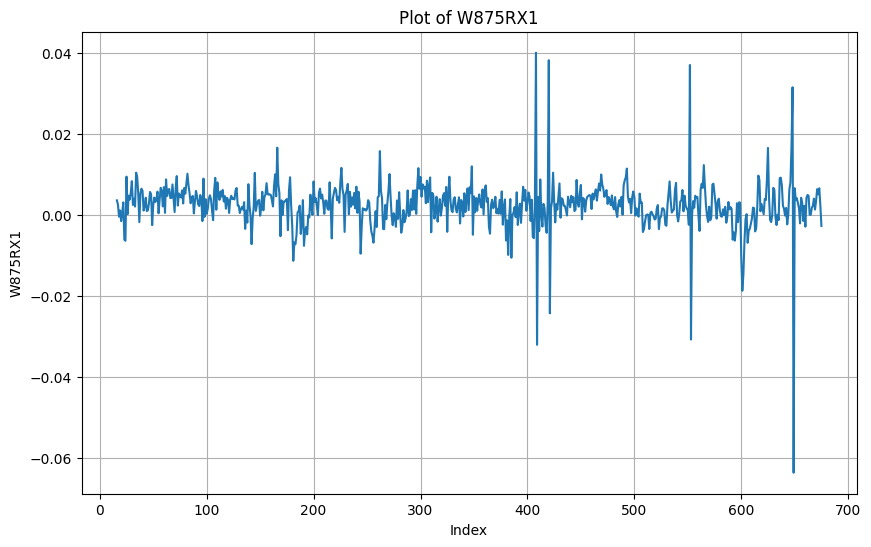

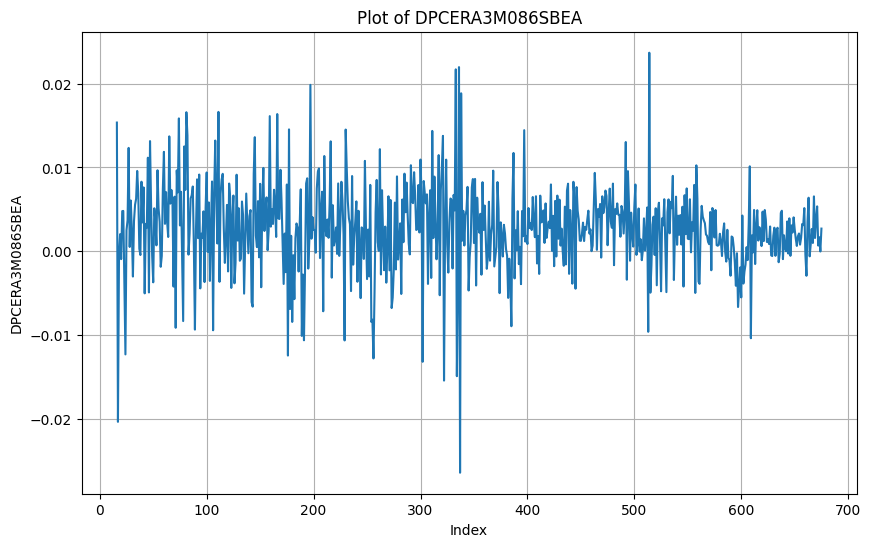

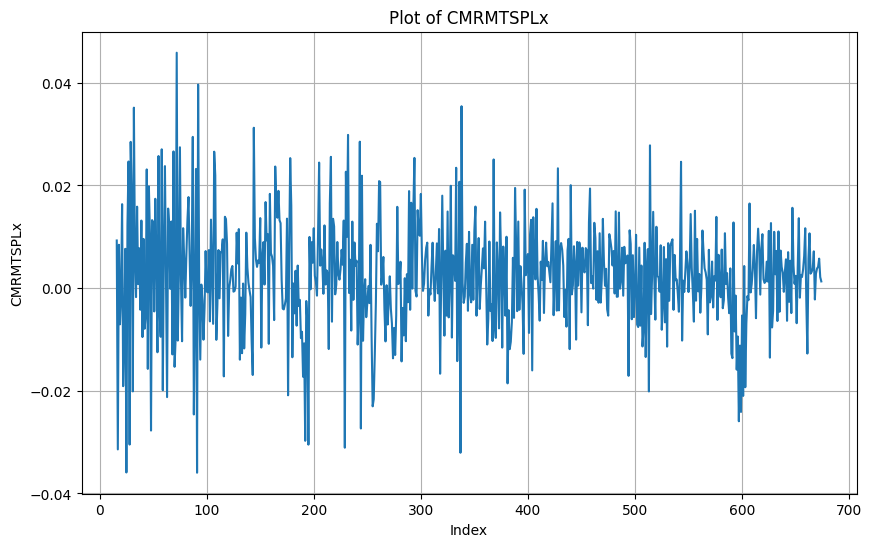

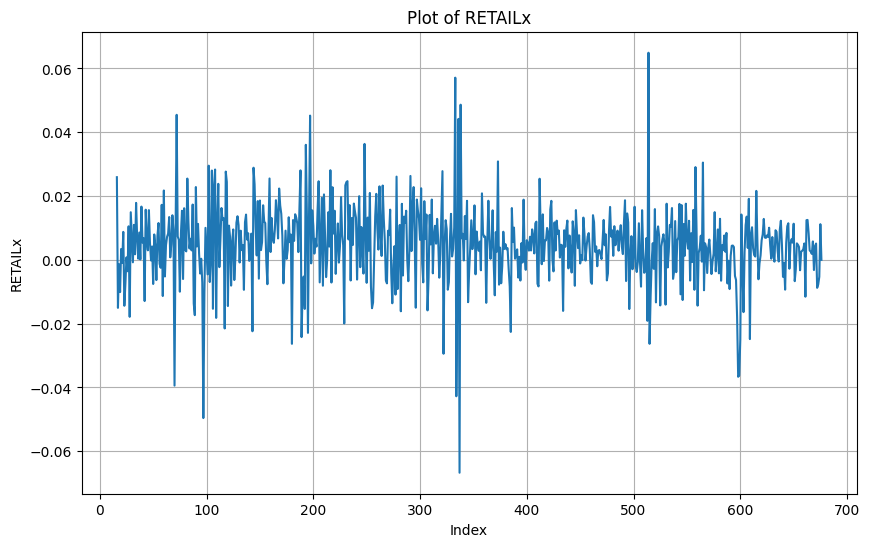

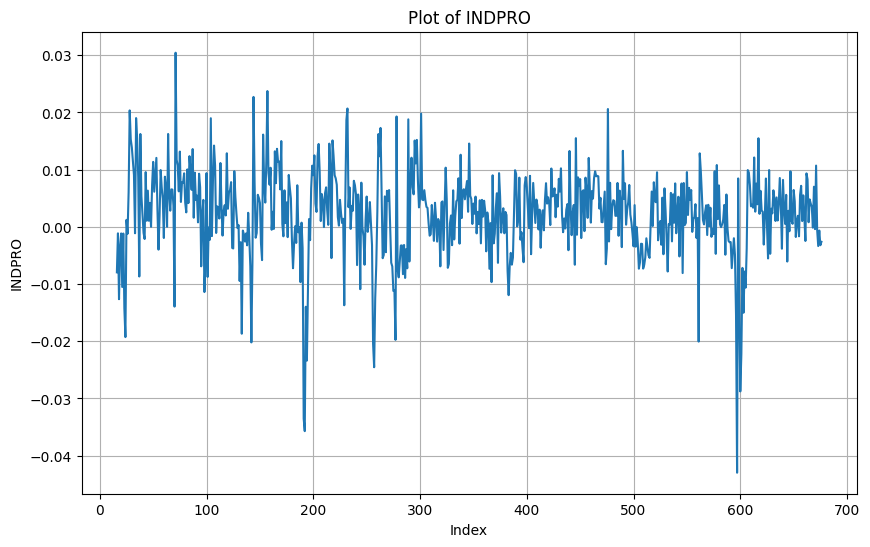

...

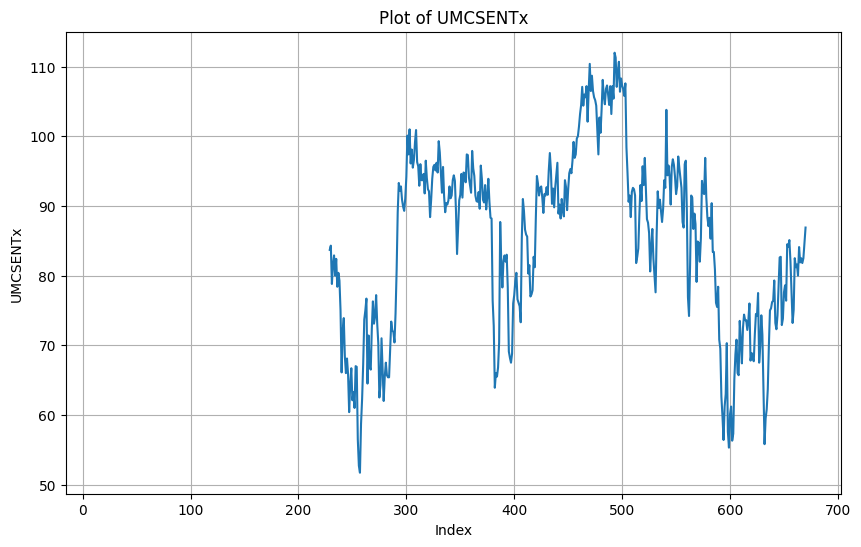

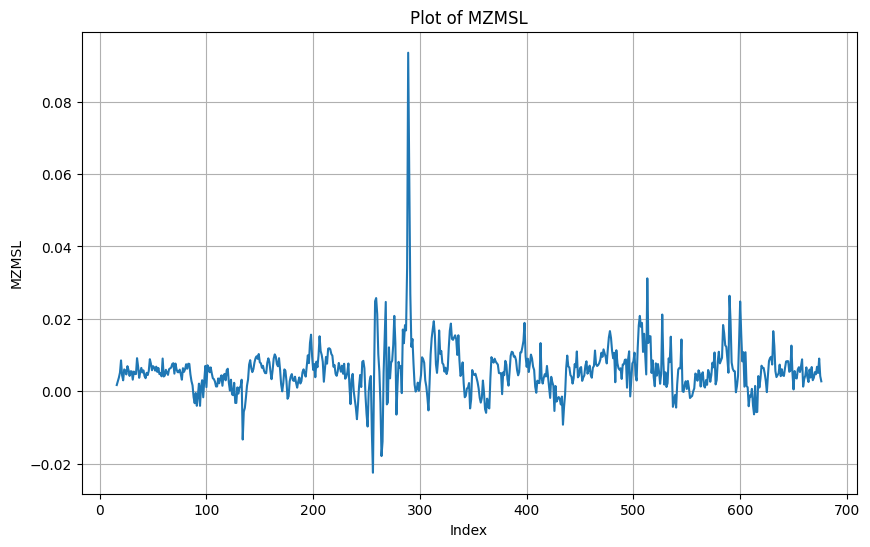

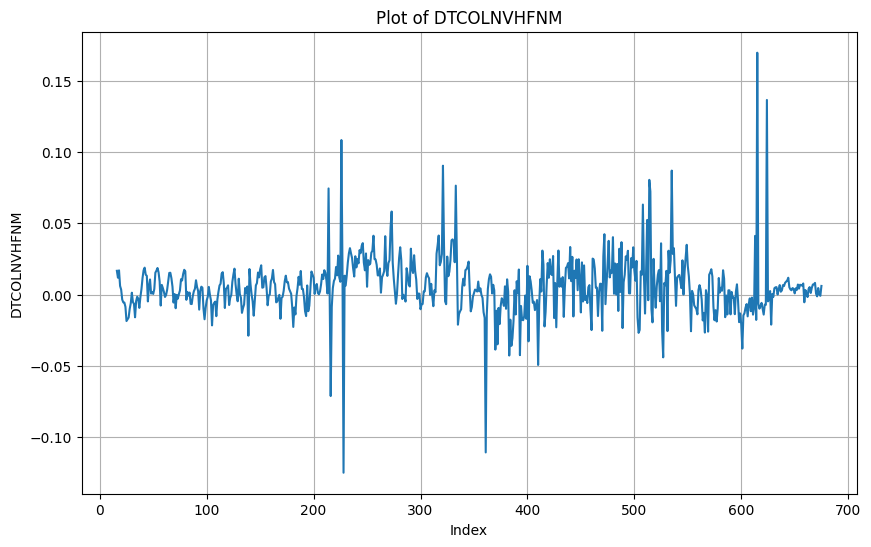

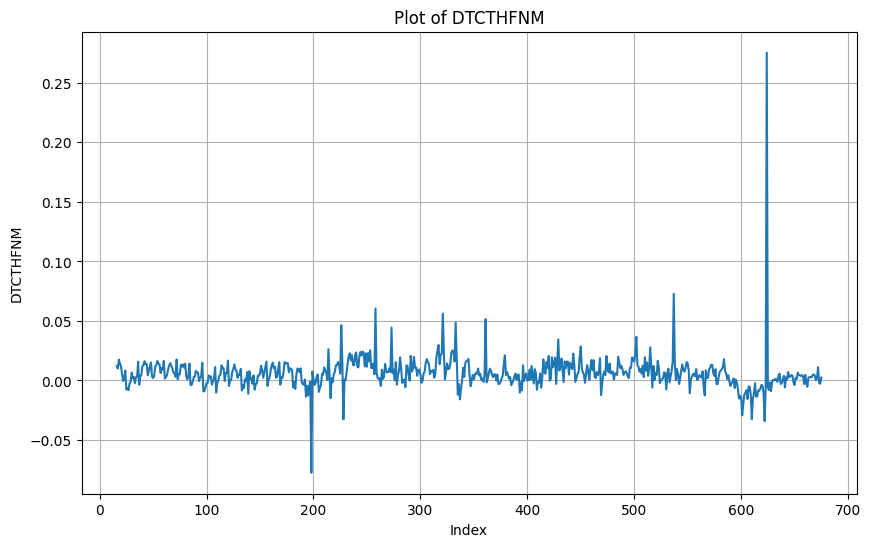

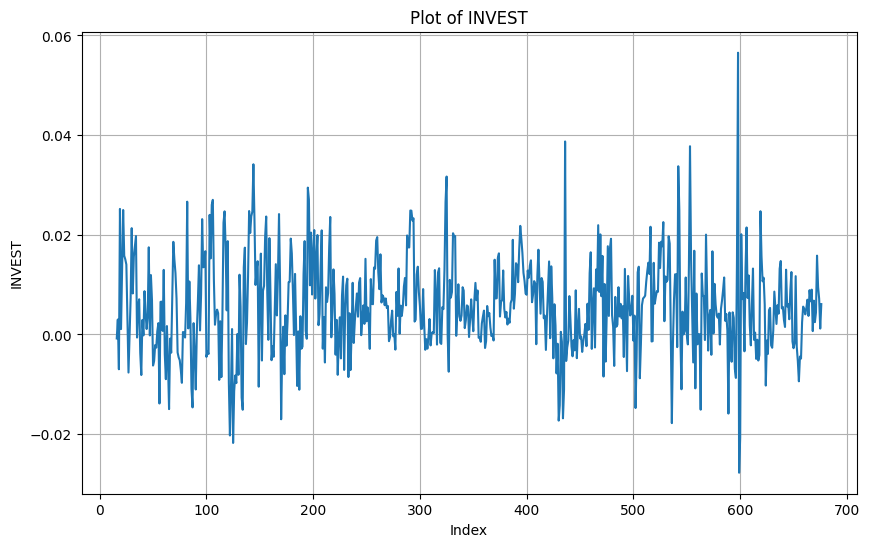

In [34]:
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame
for col in df.columns:
    plt.figure(figsize=(10, 6))  # Adjust figure size if needed
    plt.plot(df[col])
    plt.title(f'Plot of {col}')
    plt.xlabel('Index')
    plt.ylabel(col)
    plt.grid(True)
    plt.show()

data description and basic algorithm discusses in the Stock and Watson paper can be found at: https://s3.amazonaws.com/real.stlouisfed.org/wp/2015/2015-012.pdf

Criterion for choosing number of factors in factor models on page 7:
We want to have a sense of whether the number of factors is sensitive to the
vintage of data used. Hence, for our purpose, which criterion we use is not so important provided
that the same criterion is used throughout. We use the P Cp criteria developed in Bai and Ng
(2002), which is a generalization of Mallow’s Cp criteria for large dimensional panels

Alternatively, can check the largest eigenvalues or choose the number based on the best model fit.

-----------------------------------------------

There are, however, 22
series that have the idiosyncratic component explaining 90% of the variation. The ten series with the
largest idiosyncratic component are ’realln’,’busloans’,’claimsx’, ’cpiappsl’, ’ipfuels’, ’dtcolnvhfnm’,
’cuur0000sad’,’dtcthfnm’, ’ddurrg3m086sbea’, ’cpimedsl’, ’invest’. A case can be made to drop
these series from the panel; as discussed in Boivin and Ng (2006), noisy data can worsen the
quality of the factor estimates

----------------------------------------------

Alternatively, a balanced panel of 130 series dating from 1960:1 to 2014:12 can
be formed by dropping series 64, 66, 101, and 130

In [17]:
# We manually overwrite and take F.D. of USGOVT even though uniit root presence was rejected.
# df['USGOVT'] = np.log(df['USGOVT']).diff()
# df['USGOVT']

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,USGOVT
30,NaN
31,0.402014
32,0.101006
33,-0.227253
34,-1.270844
...,...
672,0.104927
673,NaN
674,NaN
675,NaN


In [35]:
from sklearn.decomposition import PCA

In [ ]:
#@markdown First code (initialised with means for the missing values)
# def em_dynamic_pca(data, n_factors, max_iter=100, tol=1e-6):
#   """ Estimate dynamic factors via PCA using an EM algorithm to impute missing values.
#   Parameters:
#     data : pd.DataFrame or 2D numpy array
#         Data matrix with rows as time observations and columns as variables.
#         Missing values should be np.nan.
#     n_factors : int
#         The number of principal components (factors) to extract.
#     max_iter : int, optional (default=100)
#         Maximum number of iterations for the EM algorithm.
#     tol : float, optional (default=1e-6)
#         Convergence threshold based on the change in imputed missing values.

#   Returns:
#     factors : ndarray
#         The estimated factor time series (scores).
#     loadings : ndarray
#         The estimated loadings matrix.
#     X_filled : ndarray
#         The data matrix after imputation (in standardized scale).
#   """
#   # Convert input data to a numpy array if it is a DataFrame.
#   if isinstance(data, pd.DataFrame):
#       X = data.values.copy()
#   else:
#       X = np.array(data, copy=True)

#   # Store the indices of missing entries for use during the iterations.
#   missing_idx = np.isnan(X)

#   # Standardize the data: compute the mean and std using non-missing values.
#   means = np.nanmean(X, axis=0)
#   stds = np.nanstd(X, axis=0)

#   # Demean and standardize. (After this, non-missing entries have mean 0 and unit variance.)
#   X_standardized = (X - means) / stds

#   # Initialize missing entries with 0 (the unconditional mean on the standardized scale).
#   X_filled = X_standardized.copy()
#   X_filled[missing_idx] = 0.0

#   # Initialize variables for the EM algorithm
#   diff = np.inf
#   iter_count = 0

#   while diff > tol and iter_count < max_iter:
#       iter_count += 1

#       # --- E-step: factor extraction via PCA ---
#       pca = PCA(n_components=n_factors)
#       # The PCA works on the current filled data matrix
#       factors = pca.fit_transform(X_filled)   # shape: (n_samples, n_factors)
#       loadings = pca.components_.T              # shape: (n_variables, n_factors)

#       # --- M-step: reconstruct the data using the estimated factors ---
#       X_hat = np.dot(factors, loadings.T)   # reconstructed matrix in standardized units

#       # Compute change over missing entries to check for convergence.
#       # We compare only the imputed values as these are updated.
#       prev_imputed = X_filled[missing_idx]
#       new_imputed = X_hat[missing_idx]
#       diff = np.linalg.norm(new_imputed - prev_imputed)

#       # Update only the missing entries.
#       X_filled[missing_idx] = new_imputed

#       # Optionally, you can print the iteration progress.
#       # print(f"Iteration {iter_count}: diff = {diff:.6f}")

#   # (At this point, the algorithm has converged and X_filled holds the updated data in standardized units.)
#   # Factors and loadings are estimated from the last PCA run.

#   # If desired, you could transform the imputed data back to original scale:
#   X_reconstructed = X_filled * stds + means

#   return factors, loadings, X_filled, X_reconstructed

# # remove transformation row and date column for now
# df_subset = df.iloc[1:, 1:]

# # Set the number of factors according to your model specification
# n_factors = 8

# # Run the EM dynamic PCA routine
# factors, loadings, X_filled_std, X_filled_original = em_dynamic_pca(df_subset, n_factors)

# # Display the results.
# print("Estimated Factors (first 5 observations):")
# print(factors[:5])
# print("\nEstimated Loadings:")
# print(loadings)


change to conditional demeaning?

# PCA

In [5]:
import numpy as np
import pandas as pd
from numpy.linalg import svd, norm
import warnings

def standardize_dataframe(df):
    """
    Standardizes the DataFrame by subtracting the mean and dividing by the standard
    deviation for each column. The mean and std are computed ignoring NaN values.

    Parameters:
      df : pandas DataFrame with time series data (rows are time, columns are variables)

    Returns:
      standardized_df : pandas DataFrame with standardized values
      stats_df        : DataFrame containing the mean and std for each column
    """
    # Calculate column-wise mean and standard deviation ignoring NaNs
    means = df.mean(skipna=True)
    stds = df.std(skipna=True)

    # Apply standardization: (x - mean) / std, preserving NaNs
    standardized_df = df.subtract(means).divide(stds)

    # Optionally, return the computed means and stds for later re-transformation if needed.
    stats_df = pd.DataFrame({'mean': means, 'std': stds})
    return standardized_df, stats_df

def initialize_balanced_panel(X):
    # Identify columns with no missing values
    balanced_cols = np.where(np.sum(np.isnan(X), axis=0) == 0)[0]
    if len(balanced_cols) == 0:
        warnings.warn("No fully balanced series found. Falling back to simple mean imputation.")
        return None, None
    X_balanced = X[:, balanced_cols]
    return X_balanced, balanced_cols

def em_dynamic_factor_balanced_init(df, num_factors, tol=1e-4, max_iter=100):
    """
    EM algorithm for dynamic factor analysis using initial estimates derived from a balanced panel.

    Parameters:
      df          : pandas DataFrame with shape (T, N); missing values should be np.nan.
      num_factors : integer, number of factors to extract.
      tol         : convergence tolerance.
      max_iter    : maximum number of iterations.

    Returns:
      F           : (T x num_factors) factor estimates (numpy array)
      Lambda      : (N x num_factors) loading estimates (numpy array)
      X_imputed   : Completed data matrix used in the final iteration.
    """
    # Convert DataFrame to numpy array (rows: time, columns: series)
    X = df.values.astype(float)  # shape: (T, N)
    T, N = X.shape

    # Create indicator matrix where 1 = observed, 0 = missing
    indicator = (~np.isnan(X)).astype(float)

    # --- Initialization using a balanced subset ---
    X_balanced, balanced_cols = initialize_balanced_panel(X)

    if X_balanced is not None:
        # Perform SVD/PCA on the balanced panel
        U_bal, s_bal, Vt_bal = svd(X_balanced, full_matrices=False)
        F_init = U_bal[:, :num_factors] * s_bal[:num_factors]  # (T x num_factors)
        Lambda_balanced = Vt_bal[:num_factors, :].T  # loadings for the balanced series (len(balanced_cols) x num_factors)

        # Estimate loadings for each series in the full dataset via OLS over available observations:
        Lambda_init = np.zeros((N, num_factors))
        for i in range(N):
            obs_idx = indicator[:, i].astype(bool)
            if np.sum(obs_idx) >= num_factors:  # Ensure enough observations
                F_obs = F_init[obs_idx, :]
                X_obs = X[obs_idx, i]
                # Solve the least squares problem F_obs * lambda_i = X_obs
                if np.linalg.matrix_rank(F_obs) == num_factors:
                    Lambda_init[i, :] = np.linalg.lstsq(F_obs, X_obs, rcond=None)[0]
                else:
                    Lambda_init[i, :] = 0
            else:
                Lambda_init[i, :] = 0

        # For missing entries, initialize using the product of the estimated loadings and factors.
        X_imputed = X.copy()
        for i in range(N):
            missing_idx = ~indicator[:, i].astype(bool)
            if np.any(missing_idx):
                # Impute as: X_hat = F_init * lambda_i
                X_imputed[missing_idx, i] = F_init[missing_idx, :].dot(Lambda_init[i, :])
    else:
        # Fall back to simple imputation if no balanced panel available.
        X_imputed = np.where(np.isnan(X), 0, X)
        Lambda_init = None
        F_init = None

    # --- EM algorithm iteration ---
    for it in range(max_iter):
        # M-step: Compute SVD on the imputed full data
        U, s, Vt = svd(X_imputed, full_matrices=False)
        F = U[:, :num_factors] * s[:num_factors]       # Factors (T x num_factors)
        Lambda = Vt[:num_factors, :].T                    # Loadings (N x num_factors)

        # Reconstruct the data matrix using the factor model.
        X_hat = F.dot(Lambda.T)

        # E-step: Update only the missing entries in the data matrix.
        X_new = X.copy()
        X_new[~indicator.astype(bool)] = X_hat[~indicator.astype(bool)]

        # Check convergence based on relative change of imputed values.
        if norm(X_new - X_imputed) / norm(X_imputed) < tol:
            print(f'Converged in {it+1} iterations.')
            X_imputed = X_new.copy()
            break

        X_imputed = X_new.copy()

    return F, Lambda, X_imputed

In [6]:
# df_subset = df.iloc[:,1:].reset_index(drop=True)
# standardized_df, stats = standardize_dataframe(df_subset)
standardized_df, stats = standardize_dataframe(df)

num_factors = 8
F, Lambda, X_complete = em_dynamic_factor_balanced_init(standardized_df, num_factors)

Converged in 52 iterations.


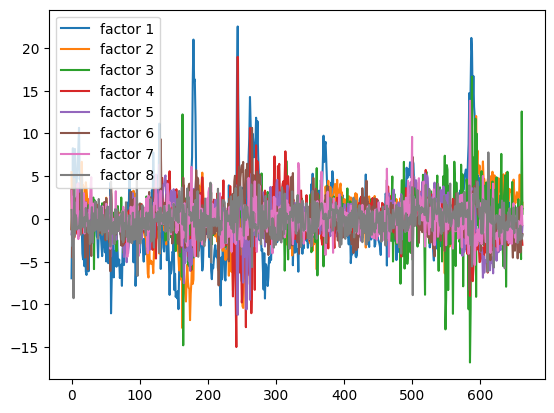

In [7]:
# removing the first transformation row significantly improve the graphs!
import matplotlib.pyplot as plt
plt.plot(F[:,0], label='factor 1')
plt.plot(F[:,1], label='factor 2')
plt.plot(F[:,2], label='factor 3')
plt.plot(F[:,3], label='factor 4')
plt.plot(F[:,4], label='factor 5')
plt.plot(F[:,5], label='factor 6')
plt.plot(F[:,6], label='factor 7')
plt.plot(F[:,7], label='factor 8')
plt.legend();

In [8]:
import statsmodels.api as sm

def compute_R2_values(X, factors):
  """ For each original variable (each column of X), run a regression on an increasing number of factors and store the R² value for each regression.
    Parameters:
    X       : numpy array (T x N), standardized data (each column is a series)
    factors : numpy array (T x r), estimated factor time series

  Returns:
    R2_matrix : numpy array (N x r), where each row i contains:
                [R2_i(1), R2_i(2), ..., R2_i(r)]
                with R2_i(k) = R² when series i is regressed on the first k factors.
  """
  T, N = X.shape
  r = factors.shape[1]
  R2_matrix = np.zeros((N, r))

  # Loop over each series (each variable i)
  for i in range(N):
      y = X[:, i]
      # For each increment k=1,..,r, run regression on the first k factors
      for k in range(1, r+1):
          X_k = factors[:, :k]
          X_k_const = sm.add_constant(X_k)
          model = sm.OLS(y, X_k_const).fit()
          R2_matrix[i, k-1] = model.rsquared
  return R2_matrix

def compute_incremental_R2(R2_matrix):
  """ Compute the incremental R² (mR2) for each series and then average across all series.
  For each series i, define:
    mR2_i(1) = R2_i(1)
    and for k >= 2,
    mR2_i(k) = R2_i(k) - R2_i(k-1)

  Also compute the average importance of factor-k over all series:
    mR2(k) = (1/N) * sum_{i=1}^{N} mR2_i(k)

  Parameters:
    R2_matrix : numpy array (N x r) with cumulative R² values

  Returns:
    mR2_individual: numpy array (N x r) of incremental R² for each series
    mR2_average   : numpy array (1 x r) of the average incremental R² for each factor
  """
  N, r = R2_matrix.shape
  mR2_individual = np.zeros((N, r))
  mR2_individual[:, 0] = R2_matrix[:, 0]

  for k in range(1, r):
      mR2_individual[:, k] = R2_matrix[:, k] - R2_matrix[:, k-1]

  mR2_average = np.mean(mR2_individual, axis=0)
  return mR2_individual, mR2_average

In [9]:
# Compute the cumulative R² for each series as factors are added.
R2_matrix = compute_R2_values(X_complete, F)

# Then compute the incremental R² (mR²) for each factor for each series and the average across series.
mR2_individual, mR2_average = compute_incremental_R2(R2_matrix)

series_names = df.columns.tolist()

# Optionally, create column labels for the factors
factor_labels = [f'Factor_{i+1}' for i in range(num_factors)]

# Create a DataFrame from the mR2_individual array with the desired indices and columns
mR2_df = pd.DataFrame(mR2_individual, index=series_names, columns=factor_labels)

In [10]:
mR2_df

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8
RPI,0.092311,0.017582,0.026079,0.020341,0.001930,0.012952,0.004068,0.017509
W875RX1,0.148736,0.020091,0.034976,0.018745,0.004074,0.006418,0.003037,0.017447
DPCERA3M086SBEA,0.071797,0.028252,0.000208,0.026666,0.008272,0.075434,0.038306,0.074108
CMRMTSPLX,0.206386,0.051468,0.000839,0.010216,0.000345,0.091486,0.012823,0.024987
RETAILX,0.088699,0.000845,0.031600,0.012424,0.000186,0.115441,0.032772,0.077321
...,...,...,...,...,...,...,...,...
UMCSENTX,0.001116,0.026854,0.008203,0.001825,0.047893,0.001259,0.219248,0.003230
MZMSL,0.013393,0.002727,0.000010,0.114354,0.057227,0.005871,0.047514,0.040979
DTCOLNVHFNM,0.000019,0.000362,0.000267,0.004008,0.001999,0.001152,0.001559,0.064971
DTCTHFNM,0.000808,0.000080,0.000721,0.002183,0.001008,0.000036,0.000074,0.073473


"Factor 1 explains 0.159 of the variation in
the data and can be interpreted as a real activity/employment factor since the mRi(1) associated with the industrial production and employment series are close to 0.7"

In [11]:
mR2_df.sort_values(by='Factor_1', ascending=False).head(20)

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8
USGOOD,0.735694,0.002275,1.020757e-03,3.921089e-03,0.050848,0.009842,0.000417,0.004325
PAYEMS,0.717910,0.004273,1.852600e-04,1.727596e-02,0.036617,0.008161,0.003814,0.038724
MANEMP,0.696959,0.007109,8.211300e-04,1.063352e-03,0.076918,0.011783,0.000012,0.000121
IPMANSICS,0.657834,0.112956,1.347716e-03,1.201580e-03,0.019723,0.093398,0.030573,0.002036
NAPM,0.653720,0.000864,1.822893e-08,2.672975e-03,0.018626,0.132667,0.015495,0.007799
DMANEMP,0.649101,0.007422,1.460262e-03,2.053968e-03,0.067858,0.008961,0.000148,0.004984
INDPRO,0.634287,0.114916,4.357255e-05,4.903583e-03,0.021884,0.097452,0.039855,0.000244
NAPMNOI,0.608448,0.027718,6.308125e-03,7.106979e-06,0.002095,0.077132,0.012996,0.015678
NAPMPI,0.605869,0.019869,2.518509e-03,7.634545e-04,0.001280,0.104880,0.016874,0.009804
CUMFNS,0.565054,0.167361,4.069157e-03,3.803466e-03,0.015879,0.088802,0.036233,0.006963


In [12]:
mR2_df.sort_values(by='Factor_2', ascending=False).head()

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8
T10YFFM,0.000362,0.627358,0.041133,0.007492,0.088949,0.118241,2.010546e-03,0.000271
AAAFFM,0.007585,0.619935,0.041789,0.004333,0.063995,0.103131,2.392794e-03,0.000032
BAAFFM,0.038187,0.591401,0.041692,0.003657,0.063390,0.061041,2.732279e-03,0.000210
T5YFFM,0.005626,0.578602,0.036873,0.015291,0.137260,0.109903,4.911513e-03,0.002290
TB3SMFFM,0.040736,0.473998,0.030800,0.000219,0.115230,0.146016,2.705756e-07,0.005179


In [13]:
mR2_df.sort_values(by='Factor_3', ascending=False).head()

,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8
CUSR0000SAC,0.000294,0.053907,0.755333,3.918639e-06,0.000885,0.000741,0.018045,1.101350e-03
DNDGRG3M086SBEA,0.000533,0.052036,0.742595,8.343991e-07,0.000797,0.000863,0.018261,1.237515e-03
CPIAUCSL,0.002153,0.056010,0.706088,6.326153e-04,0.001660,0.001517,0.022036,2.124318e-04
CUSR0000SA0L5,0.002505,0.052387,0.665749,3.543596e-04,0.002222,0.001335,0.023813,1.521372e-07
CUUR0000SA0L2,0.000325,0.051728,0.636898,2.723598e-05,0.001631,0.003588,0.019074,2.635835e-03


In [14]:
mR2_df.loc['INDPRO',:]

,INDPRO
Factor_1,0.634287
Factor_2,0.114916
Factor_3,0.000044
Factor_4,0.004904
Factor_5,0.021884
Factor_6,0.097452
Factor_7,0.039855
Factor_8,0.000244


In [15]:
mR2_average

array([0.15957991, 0.069102  , 0.06535626, 0.05577203, 0.04201656,
       0.03657782, 0.02872796, 0.02586034])

Using the same transformations as the paper nearly gives us identical results, slight differences remain presumably due to NAs not being removed yet.

very close to R^2 of actually paper. The first factor explained 0.159 of the variation in the paper of the authors, by us 0.155. but our second factor is a bit off.

"Factor 2 contributes to 0.069
of the variation in the data and is dominated by forward-looking variables such as term interest rate spreads and inventories. Factor 3 has an mR2(3) of 0.066 and its explanatory power is concentrated on price variables and hence can be interpreted as an inflation factor. Factors 4 and 5 are a mix of housing and interest rate variables. Like Factor 1, Factor 6 concentrates on real/employment
variables. Factor 7 has explanatory power for stock market variables while factor 8 has explanatory power for exchange rates"

#### So, the previous code does not really give the same result, so let's just do a PCA on a balanced dataset

In [ ]:
import numpy as np
import pandas as pd
from numpy.linalg import svd

def pca_on_balanced_panel(df, num_factors=3):
    """
    Extracts the balanced panel (columns with no missing values) from df,
    standardizes the data, and performs PCA via SVD to extract factors and loadings.

    Parameters:
      df          : pandas DataFrame with shape (T, N) where each column is a variable.
      num_factors : integer specifying the number of factors to extract.

    Returns:
      factors     : numpy array of shape (T, num_factors) containing the factor estimates.
      loadings    : numpy array of shape (N_balanced, num_factors) containing the loading estimates.
      balanced_cols : list of column names representing the balanced panel.
    """
    # Identify the columns (series) with no missing observations.
    balanced_cols = [col for col in df.columns if df[col].notnull().all()]
    if len(balanced_cols) == 0:
        raise ValueError("No fully observed (balanced) columns were found in the dataset.")

    # Create a subset with the balanced panel.
    df_balanced = df[balanced_cols]

    # Standardize the data: for each variable subtract the mean and divide by standard deviation.
    df_balanced_std = (df_balanced - df_balanced.mean()) / df_balanced.std()

    # Convert the standardized data to a numpy array.
    # Note: rows = time observations, columns = balanced series.
    X = df_balanced_std.values  # shape: (T, N_balanced)

    # Run SVD to perform PCA.
    # X = U * s * Vt, where the columns of U are the left singular vectors.
    U, s, Vt = svd(X, full_matrices=False)

    # Compute the factor estimates as the first num_factors principal components.
    # Multiply U by the singular values s (for the selected factors) to obtain the factor scores.
    factors = U[:, :num_factors] * s[:num_factors]

    # The loadings are given by the rows of Vt.T corresponding to the first num_factors.
    loadings = Vt[:num_factors, :].T  # shape: (N_balanced, num_factors)

    return factors, loadings, balanced_cols


In [ ]:
num_factors = 8  # Example: extracting three factors.
factors, loadings, balanced_cols = pca_on_balanced_panel(df, num_factors)

print("Shape of factor estimates (T x num_factors):", factors.shape)
print("Shape of loading estimates (N_balanced x num_factors):", loadings.shape)

Shape of factor estimates (T x num_factors): (662, 8)
Shape of loading estimates (N_balanced x num_factors): (110, 8)


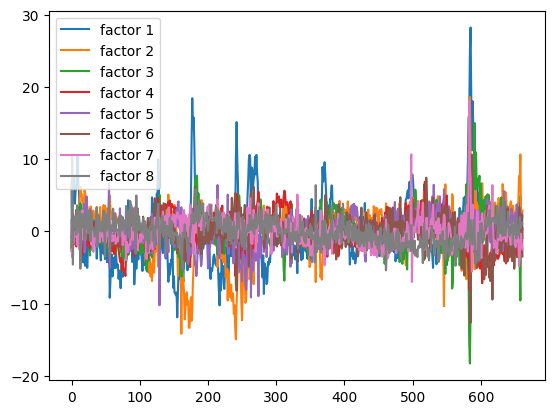

In [ ]:
plt.plot(F[:,0], label='factor 1')
plt.plot(F[:,1], label='factor 2')
plt.plot(F[:,2], label='factor 3')
plt.plot(F[:,3], label='factor 4')
plt.plot(F[:,4], label='factor 5')
plt.plot(F[:,5], label='factor 6')
plt.plot(F[:,6], label='factor 7')
plt.plot(F[:,7], label='factor 8')
plt.legend();

In [ ]:
balanced_cols = [col for col in df.columns if df[col].notnull().all()]
if len(balanced_cols) == 0:
    raise ValueError("No fully observed (balanced) columns were found in the dataset.")

# Create a subset with the balanced panel.
df_balanced = df[balanced_cols]

In [ ]:
# Compute the cumulative R² for each series as factors are added.
R2_matrix = compute_R2_values(df_balanced.to_numpy(), factors)

# Then compute the incremental R² (mR²) for each factor for each series and the average across series.
mR2_individual, mR2_average = compute_incremental_R2(R2_matrix)

series_names = df_balanced.columns.tolist()

# Optionally, create column labels for the factors
factor_labels = [f'Factor_{i+1}' for i in range(num_factors)]

# Create a DataFrame from the mR2_individual array with the desired indices and columns
mR2_df = pd.DataFrame(mR2_individual, index=series_names, columns=factor_labels)

print(mR2_average)

[0.17643883 0.11272064 0.0587682  0.04857937 0.04303596 0.03944118
 0.03036685 0.02760333]


It did not change a lot... idk what is the problem then

From the descriptive paper: Factor 1 explains 0.159 of the variation in
the data and can be interpreted as a real activity/employment factor since the mRi(1) associated
with the industrial production and employment series are close to 0.7. Factor 2 contributes to 0.069
of the variation in the data and is dominated by forward-looking variables such as term interest rate
spreads and inventories. Factor 3 has an mR2
(3) of 0.066 and its explanatory power is concentrated
on price variables and hence can be interpreted as an inflation factor. Factors 4 and 5 are a mix
of housing and interest rate variables. Like Factor 1, Factor 6 concentrates on real/employment
variables. Factor 7 has explanatory power for stock market variables while factor 8 has explanatory
power for exchange rates.

# Regressions with above factors

We get the same 8 factors as in the paper. We now use these to run our OLS regressions for forecasting.

In [30]:
# Factors in F 663*8
# Dataframe in df 663*134

# Create a DataFrame from the factors array
factors_df = pd.DataFrame(F, columns=[f"Factor_{i+1}" for i in range(8)])

# Concatenate the factors DataFrame with the original DataFrame
# Reset the index of the original DataFrame to align with the factors
df1 = df.copy()
df1 = df1.reset_index(drop=True)

merged_df = pd.concat([df1, factors_df], axis=1)
# re-adding the date index<
merged_df

,RPI,W875RX1,DPCERA3M086SBEA,CMRMTSPLX,RETAILX,INDPRO,IPFPNSS,IPFINAL,IPCONGD,IPDCONGD,...,DTCTHFNM,INVEST,Factor_1,Factor_2,Factor_3,Factor_4,Factor_5,Factor_6,Factor_7,Factor_8
0,0.004317,0.005743,0.002754,0.017046,0.026606,0.025915,0.024099,0.029025,0.031236,0.103832,...,-0.011739,-0.013330,-6.934222,5.466204,-1.202397,-1.196496,-1.801830,3.390360,3.315966,1.056707
1,0.000669,0.000488,0.004380,0.014596,0.003696,-0.008938,-0.005685,-0.003441,-0.011455,-0.013859,...,0.005388,-0.018942,-0.316995,-1.788123,0.611709,1.327181,-0.865359,-4.515779,0.398606,-3.170633
2,0.001837,0.000843,0.014064,-0.027752,-0.001102,-0.009018,-0.003426,-0.001148,0.001151,-0.019968,...,0.000951,0.003490,8.275524,-1.901062,-1.114297,0.428322,-0.066392,-0.845295,2.591796,-2.337149
3,0.003498,0.003585,0.015352,0.009277,0.025903,-0.007960,0.002286,0.001148,0.006880,-0.001185,...,0.005452,0.024136,-1.323410,-2.175039,0.984586,2.186814,-0.347971,0.150548,-1.615693,-9.263909
4,0.002533,0.002559,-0.020349,-0.031425,-0.015047,-0.001140,0.005691,0.006865,0.005698,0.009456,...,-0.002067,0.003798,5.874565,0.745386,-2.046710,-2.190693,1.741519,-0.321337,2.033077,4.684201
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
658,0.005568,0.006340,0.005355,0.004154,0.005121,0.010701,0.015374,0.018260,0.021534,0.035432,...,0.002456,0.001929,-3.339065,5.186390,-2.518394,-1.291269,-2.042973,1.413768,-1.719544,-2.464068
659,0.005603,0.005059,0.000681,0.005742,-0.008769,-0.000512,-0.005710,-0.007078,-0.005316,-0.004775,...,0.008617,0.011412,0.870982,2.752216,-1.900043,-0.818588,-1.420465,-3.932728,-0.625795,-0.766612
660,0.007940,0.006564,0.001677,0.002140,-0.007720,-0.003360,-0.001748,-0.002898,0.002893,-0.009371,...,-0.013636,-0.006287,1.998911,2.768811,-4.692799,-0.066388,-1.334611,-2.734969,0.084503,-2.283863
661,0.002664,0.002343,-0.000026,0.001305,-0.005320,-0.000649,0.001855,0.002304,0.004490,-0.019711,...,-0.000127,-0.002390,0.937693,-0.515081,12.565505,-1.940212,-2.356603,-2.439633,1.516392,-2.318017


## Simple Regression

In [45]:
merged_df.columns

Index(['RPI', 'W875RX1', 'DPCERA3M086SBEA', 'CMRMTSPLX', 'RETAILX', 'INDPRO',
       'IPFPNSS', 'IPFINAL', 'IPCONGD', 'IPDCONGD',
       ...
       'DTCTHFNM', 'INVEST', 'Factor_1', 'Factor_2', 'Factor_3', 'Factor_4',
       'Factor_5', 'Factor_6', 'Factor_7', 'Factor_8'],
      dtype='object', length=142)

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


Forecast INDPRO (h=1 months): RMSE = nan, Normalised RMSE = nan



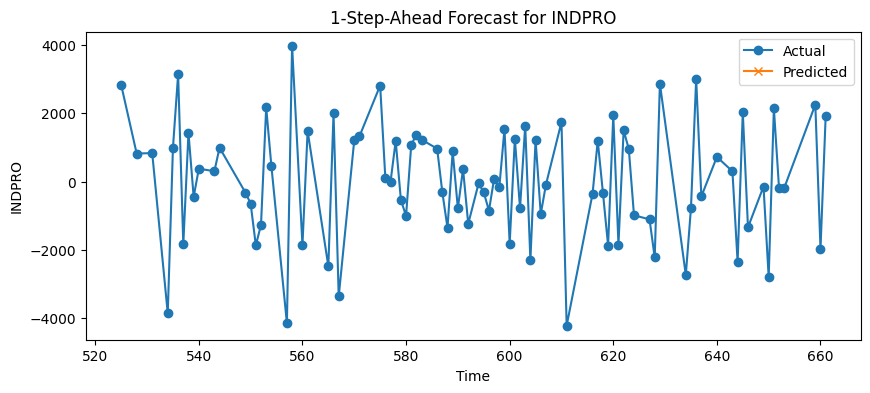

Forecast RPI (h=1 months): RMSE = 0.0087, Normalised RMSE = 6.2287



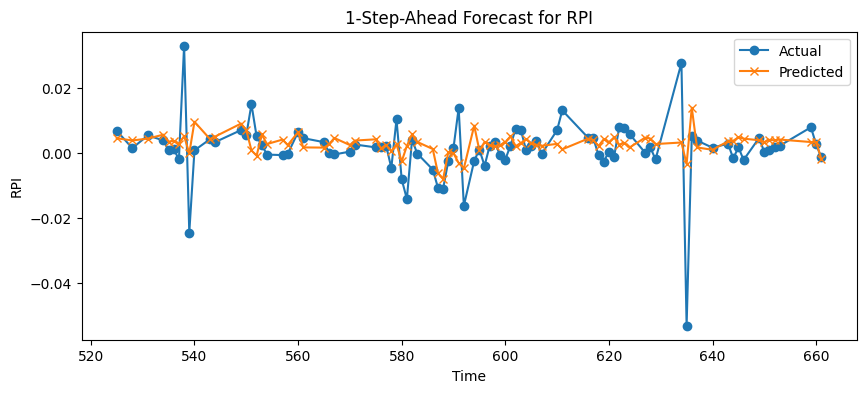

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


Forecast INDPRO (h=6 months): RMSE = nan, Normalised RMSE = nan



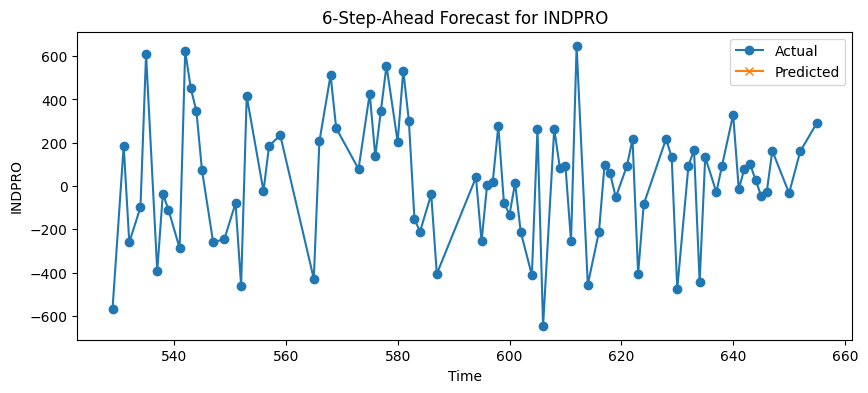

Forecast RPI (h=6 months): RMSE = 0.0090, Normalised RMSE = 9.1168



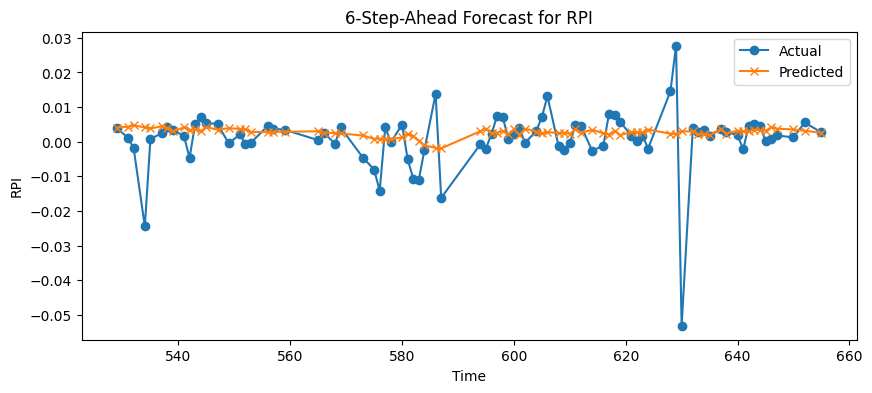

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


Forecast INDPRO (h=12 months): RMSE = nan, Normalised RMSE = nan



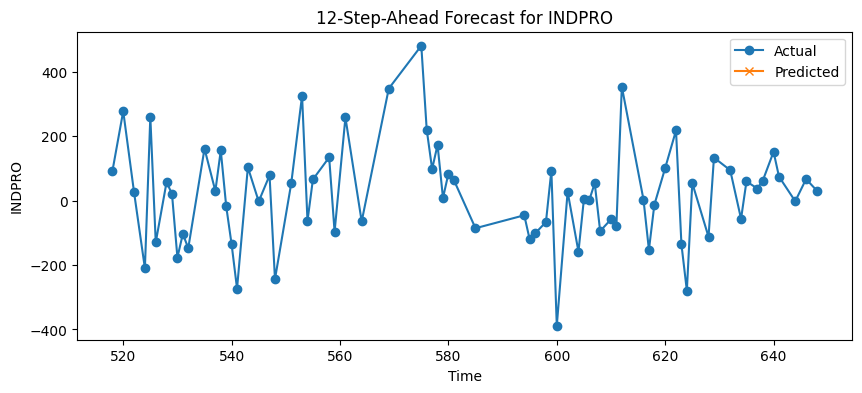

Forecast RPI (h=12 months): RMSE = 0.0098, Normalised RMSE = 7.1936



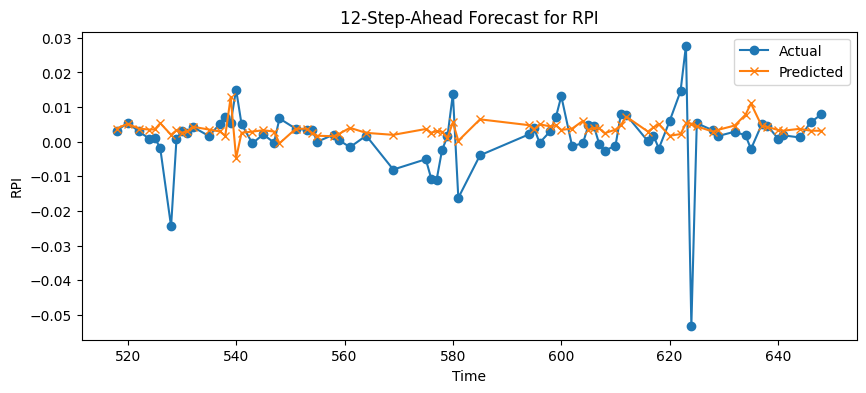

Summary of Forecast Results:
   Horizon  Target                                  Specification      RMSE  \
0        1  INDPRO  Fixed (y_current & contemporaneous 8 factors)       NaN   
2        6  INDPRO  Fixed (y_current & contemporaneous 8 factors)       NaN   
4       12  INDPRO  Fixed (y_current & contemporaneous 8 factors)       NaN   
1        1     RPI  Fixed (y_current & contemporaneous 8 factors)  0.008722   
3        6     RPI  Fixed (y_current & contemporaneous 8 factors)  0.008970   
5       12     RPI  Fixed (y_current & contemporaneous 8 factors)  0.009848   

   Norm_RMSE  
0        NaN  
2        NaN  
4        NaN  
1   6.228703  
3   9.116764  
5   7.193626  


In [41]:
#    Run forecasting regressions with a fixed specification:
#    Regress the h-step-ahead dependent variable on a constant, the current (t) value of the target, and the 8 factors.
forecast_horizons = [1, 6, 12]  # Forecast horizons in months
forecast_results = []  # List to store forecasting results

for h in forecast_horizons:
    df_forecast = merged_df.copy()

    # Construct forecast-dependent variables:
    # For INDPRO (assumed real), use an annualised growth transformation:
    df_forecast['INDPRO_lead'] = (1200/h) * np.log(df_forecast['INDPRO'].shift(-h) / df_forecast['INDPRO'])
    # For RPI, forecast the level (modify transformation if needed):
    df_forecast['RPI_lead'] = df_forecast['RPI'].shift(-h)

    # Drop rows with missing lead values.
    df_forecast = df_forecast.dropna(subset=['INDPRO_lead', 'RPI_lead']).copy()

    for target in ['INDPRO', 'RPI']:
        if target == 'INDPRO':
            y_dep = df_forecast['INDPRO_lead']
        else:
            y_dep = df_forecast['RPI_lead']
        y_current = df_forecast[target]

        # Use the eight pre-selected factors
        factor_cols = [f'Factor_{i+1}' for i in range(8)]
        X_factors = df_forecast[factor_cols]

        # Build a fixed design matrix with:
        #   - Constant, current value of y (y_current), and
        #   - The contemporaneous factors (F_t).
        design_df = pd.concat([y_dep, y_current, X_factors], axis=1).dropna()
        design_df.rename(columns={y_dep.name: 'y_dep', y_current.name: 'y_current'}, inplace=True)

        X_reg = design_df[['y_current'] + factor_cols]
        X_reg = sm.add_constant(X_reg)
        y_reg = design_df['y_dep']

        # Split the sample into training (80%) and testing (20%).
        split_idx = int(len(design_df) * 0.8)
        X_train = X_reg.iloc[:split_idx, :]
        X_test = X_reg.iloc[split_idx:, :]
        y_train = y_reg.iloc[:split_idx]
        y_test = y_reg.iloc[split_idx:]

        # Estimate the forecasting regression using OLS.
        model = sm.OLS(y_train, X_train).fit()
        y_pred = model.predict(X_test)
        rmse = np.sqrt(np.mean((y_test - y_pred)**2))
        norm_rmse = rmse / np.mean(y_test)

        print(f"Forecast {target} (h={h} months): RMSE = {rmse:.4f}, Normalised RMSE = {norm_rmse:.4f}\n")

        forecast_results.append({
            'Horizon': h,
            'Target': target,
            'Specification': 'Fixed (y_current & contemporaneous 8 factors)',
            'RMSE': rmse,
            'Norm_RMSE': norm_rmse
        })

        plt.figure(figsize=(10, 4))
        plt.plot(y_test.index, y_test, label='Actual', marker='o')
        plt.plot(y_test.index, y_pred, label='Predicted', marker='x')
        plt.title(f"{h}-Step-Ahead Forecast for {target}")
        plt.xlabel("Time")
        plt.ylabel(target)
        plt.legend()
        plt.show()

# Summarise forecasting results.
results_df = pd.DataFrame(forecast_results)
print("Summary of Forecast Results:")
print(results_df.sort_values(by=['Target', 'Horizon']))

## Expanded regression with additional lags of y

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-38-bb216e5b1641>:65: RuntimeWarning: divide by zero encountered in log
  bic_val = T_reg * np.log(SSR/T_reg) + k * np.log(T_reg)
<ipython-input-38-bb216e5b1641>:65: RuntimeWarning: divide by zero encountered in log
  bic_val = T_reg * np.log(SSR/T_reg) + k * np.log(T_reg)
<ipython-input-38-bb216e5b1641>:65: RuntimeWarning: divide by zero encountered in log
  bic_val = T_reg * np.log(SSR/T_reg) + k * np.log(T_reg)
<ipython-input-38-bb216e5b1641>:65: RuntimeWarning: divide by zero encountered in log
  bic_val = T_reg * np.log(SSR/T_reg) + k * np.log(T_reg)
<ipython-input-38-bb216e5b1641>:65: RuntimeWarning: divide by zero encountered 


Forecasting INDPRO at horizon 1 months:
Optimal lag order (p) for y_current selected via BIC: 0 with BIC = -inf
RMSE: nan, Normalised RMSE: nan



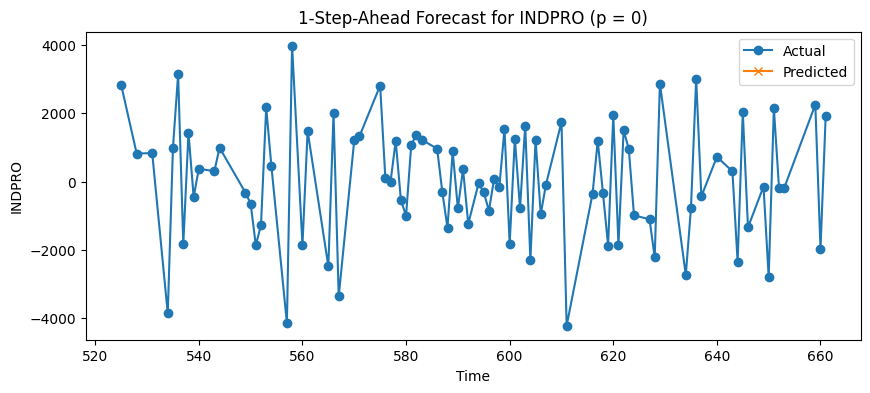


Forecasting RPI at horizon 1 months:
Optimal lag order (p) for y_current selected via BIC: 0 with BIC = -4458.0307
RMSE: 0.0087, Normalised RMSE: 6.2287



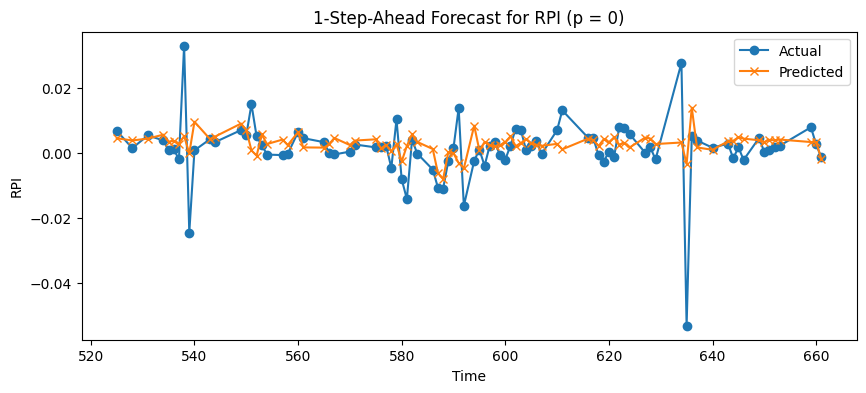

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-38-bb216e5b1641>:65: RuntimeWarning: divide by zero encountered in log
  bic_val = T_reg * np.log(SSR/T_reg) + k * np.log(T_reg)
<ipython-input-38-bb216e5b1641>:65: RuntimeWarning: divide by zero encountered in log
  bic_val = T_reg * np.log(SSR/T_reg) + k * np.log(T_reg)
<ipython-input-38-bb216e5b1641>:65: RuntimeWarning: divide by zero encountered in log
  bic_val = T_reg * np.log(SSR/T_reg) + k * np.log(T_reg)
<ipython-input-38-bb216e5b1641>:65: RuntimeWarning: divide by zero encountered in log
  bic_val = T_reg * np.log(SSR/T_reg) + k * np.log(T_reg)
<ipython-input-38-bb216e5b1641>:65: RuntimeWarning: divide by zero encountered 


Forecasting INDPRO at horizon 6 months:
Optimal lag order (p) for y_current selected via BIC: 0 with BIC = -inf
RMSE: nan, Normalised RMSE: nan



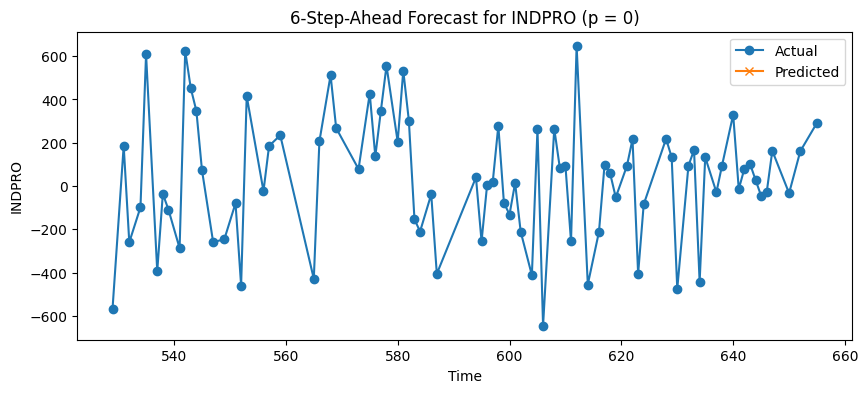


Forecasting RPI at horizon 6 months:
Optimal lag order (p) for y_current selected via BIC: 0 with BIC = -4233.3846
RMSE: 0.0090, Normalised RMSE: 9.1168



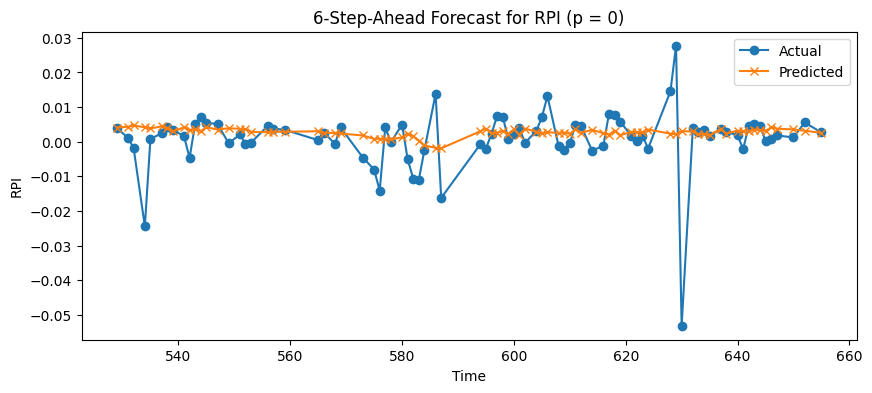

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
<ipython-input-38-bb216e5b1641>:65: RuntimeWarning: divide by zero encountered in log
  bic_val = T_reg * np.log(SSR/T_reg) + k * np.log(T_reg)
<ipython-input-38-bb216e5b1641>:65: RuntimeWarning: divide by zero encountered in log
  bic_val = T_reg * np.log(SSR/T_reg) + k * np.log(T_reg)
<ipython-input-38-bb216e5b1641>:65: RuntimeWarning: divide by zero encountered in log
  bic_val = T_reg * np.log(SSR/T_reg) + k * np.log(T_reg)
<ipython-input-38-bb216e5b1641>:65: RuntimeWarning: divide by zero encountered in log
  bic_val = T_reg * np.log(SSR/T_reg) + k * np.log(T_reg)
<ipython-input-38-bb216e5b1641>:65: RuntimeWarning: divide by zero encountered 


Forecasting INDPRO at horizon 12 months:
Optimal lag order (p) for y_current selected via BIC: 0 with BIC = -inf
RMSE: nan, Normalised RMSE: nan



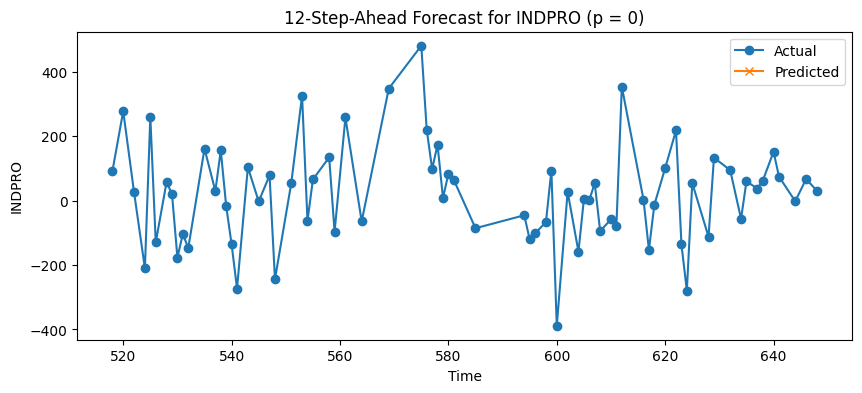


Forecasting RPI at horizon 12 months:
Optimal lag order (p) for y_current selected via BIC: 0 with BIC = -3716.1868
RMSE: 0.0098, Normalised RMSE: 7.1936



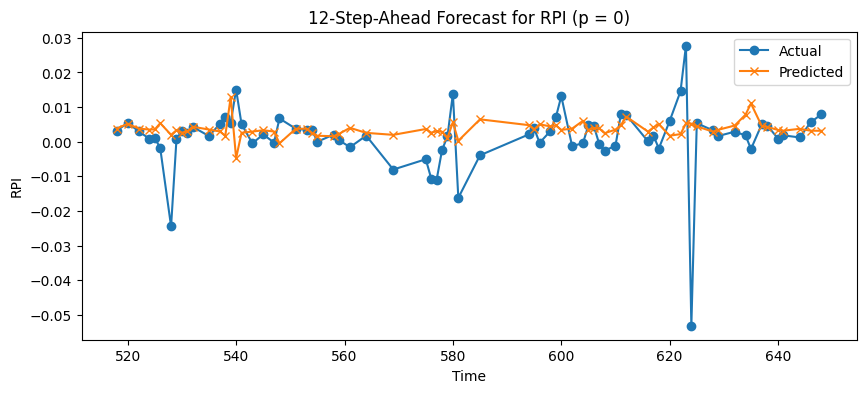

Summary of Forecast Results:
   Horizon  Target  OptimalLag_y                         Specification  \
0        1  INDPRO             0  y current + optimal lags + 8 factors   
2        6  INDPRO             0  y current + optimal lags + 8 factors   
4       12  INDPRO             0  y current + optimal lags + 8 factors   
1        1     RPI             0  y current + optimal lags + 8 factors   
3        6     RPI             0  y current + optimal lags + 8 factors   
5       12     RPI             0  y current + optimal lags + 8 factors   

       RMSE  Norm_RMSE  
0       NaN        NaN  
2       NaN        NaN  
4       NaN        NaN  
1  0.008722   6.228703  
3  0.008970   9.116764  
5  0.009848   7.193626  


In [38]:
# ----- Forecasting Regressions with Optimal Lag Selection via BIC -----

# Set forecast horizons (in months)
forecast_horizons = [1, 6, 12]
forecast_results = []  # List to store forecasting results

# Define maximum number of lags (for y_current) to test
max_lag = 6

# Loop over forecast horizons.
for h in forecast_horizons:
    df_forecast = merged_df.copy()

    # Construct forecast-dependent variables:
    # For INDPRO (assumed to be a real variable), apply the annualised growth transformation.
    df_forecast['INDPRO_lead'] = (1200/h) * np.log(df_forecast['INDPRO'].shift(-h) / df_forecast['INDPRO'])
    # For RPI, forecast the level (adjust the transformation if needed).
    df_forecast['RPI_lead'] = df_forecast['RPI'].shift(-h)

    # Drop rows with missing lead values.
    df_forecast = df_forecast.dropna(subset=['INDPRO_lead', 'RPI_lead']).copy()

    for target in ['INDPRO', 'RPI']:
        # Select the dependent variable
        if target == 'INDPRO':
            y_dep = df_forecast['INDPRO_lead']
        else:
            y_dep = df_forecast['RPI_lead']
        y_current = df_forecast[target]

        # Use the eight pre-selected factors.
        factor_cols = [f'Factor_{i+1}' for i in range(8)]
        X_factors = df_forecast[factor_cols]

        # --- Optimal lag selection for y_current (using BIC) ---
        # Test candidate lag orders from 0 to max_lag.
        candidate_lags = list(range(max_lag+1))
        bic_values = []
        design_matrices = []

        # Build a base DataFrame with y_dep and the current target.
        base_df = pd.concat([y_dep, y_current], axis=1)
        base_df.rename(columns={y_dep.name: 'y_dep', y_current.name: 'y_current'}, inplace=True)
        # Also include the contemporaneous factors.
        base_df = pd.concat([base_df, X_factors], axis=1)

        for p in candidate_lags:
            # Create a copy for the candidate model.
            df_candidate = base_df.copy()
            # Add p lags of the target variable.
            for lag in range(1, p+1):
                df_candidate[f'y_lag{lag}'] = y_current.shift(lag)
            df_candidate = df_candidate.dropna()
            if df_candidate.empty:
                bic_values.append(np.inf)
                design_matrices.append(None)
                continue
            y_reg = df_candidate['y_dep']
            X_reg = df_candidate.drop(columns='y_dep')
            X_reg = sm.add_constant(X_reg)
            model_candidate = sm.OLS(y_reg, X_reg).fit()
            T_reg = len(y_reg)
            SSR = np.sum(model_candidate.resid**2)
            k = X_reg.shape[1]
            bic_val = T_reg * np.log(SSR/T_reg) + k * np.log(T_reg)
            bic_values.append(bic_val)
            design_matrices.append(df_candidate)

        best_idx = np.argmin(bic_values)
        best_p = candidate_lags[best_idx]
        best_design_df = design_matrices[best_idx]

        print(f"\nForecasting {target} at horizon {h} months:")
        print(f"Optimal lag order (p) for y_current selected via BIC: {best_p} with BIC = {bic_values[best_idx]:.4f}")

        # --- Now, use the best design DataFrame for forecasting ---
        X_all = best_design_df.drop(columns='y_dep')
        X_all = sm.add_constant(X_all, has_constant='add')
        y_all = best_design_df['y_dep']

        split_idx = int(len(best_design_df) * 0.8)
        X_train = X_all.iloc[:split_idx, :]
        X_test = X_all.iloc[split_idx:, :]
        y_train = y_all.iloc[:split_idx]
        y_test = y_all.iloc[split_idx:]

        final_model = sm.OLS(y_train, X_train).fit()
        y_pred = final_model.predict(X_test)
        rmse = np.sqrt(np.mean((y_test - y_pred)**2))
        norm_rmse = rmse / np.mean(y_test)

        print(f"RMSE: {rmse:.4f}, Normalised RMSE: {norm_rmse:.4f}\n")

        forecast_results.append({
            'Horizon': h,
            'Target': target,
            'OptimalLag_y': best_p,
            'Specification': 'y current + optimal lags + 8 factors',
            'RMSE': rmse,
            'Norm_RMSE': norm_rmse
        })

        plt.figure(figsize=(10, 4))
        plt.plot(y_test.index, y_test, label='Actual', marker='o')
        plt.plot(y_test.index, y_pred, label='Predicted', marker='x')
        plt.title(f"{h}-Step-Ahead Forecast for {target} (p = {best_p})")
        plt.xlabel("Time")
        plt.ylabel(target)
        plt.legend()
        plt.show()

# Summarise forecasting results.
results_df = pd.DataFrame(forecast_results)
print("Summary of Forecast Results:")
print(results_df.sort_values(by=['Target', 'Horizon']))